#Non-Linear ARX (Final Code without Numba,Jit

In [ ]:
import numpy as np
import cv2
import hashlib
import time
import math
import matplotlib.pyplot as plt
from collections import Counter

# ============================================================
# 1. MATHEMATICAL CORE (Fibonacci Fast Doubling)
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

# ============================================================
# 2. ENCRYPTION & DECRYPTION ENGINES (Non-Linear ARX Update)
# ============================================================

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)

    # Forward Pass
    prev = int(iv_bytes[0])
    for i in range(n):
        # 1. XOR and Add
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        # 2. Introduce Non-Linearity: Circular Rotation based on Keystream
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        # 3. Diffusion with IV
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    # Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        # Fixed rotation for backward pass
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

def decrypt_engine(ciphertext, keystream, iv_bytes):
    n = len(ciphertext)
    plain = np.copy(ciphertext)

    # Reverse Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        curr_val = int(plain[i])
        # Reverse fixed rotation
        val = ((curr_val << 5) | (curr_val >> 3)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev_back) % 256
        prev_back = curr_val

    # Reverse Forward Pass
    prev = int(iv_bytes[0])
    for i in range(n):
        curr_val = int(plain[i])
        # Reverse Diffusion
        val = (curr_val - int(iv_bytes[i % 16])) % 256
        # Reverse Keystream-based Rotation
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << (8 - rot)) | (val >> rot)) & 0xFF
        # Final XOR
        plain[i] = (val ^ int(keystream[i]) ^ prev) % 256
        prev = curr_val
    return plain


#Histogram Analysis


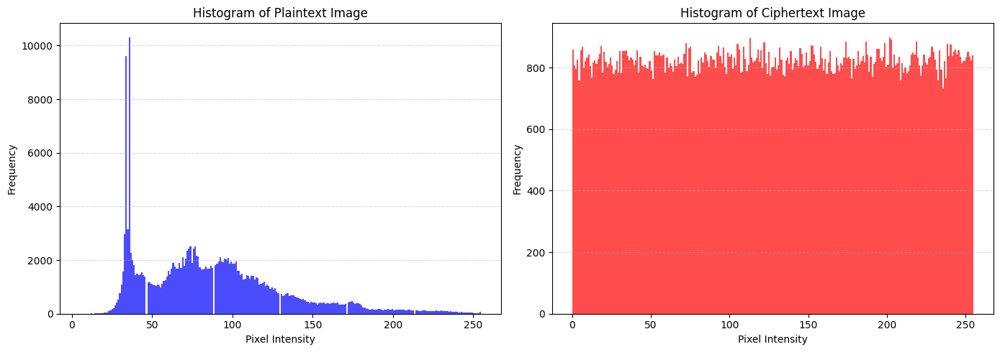

In [ ]:
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION FUNCTIONS
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

# ============================================================
# 2. EXECUTION & DUAL-PLOT GENERATION
# ============================================================

image_path ="/content/sample_image_testing.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Image not found.")
else:
    # Preparation
    original_flat = img.flatten()
    img_hash = hashlib.sha256(original_flat.tobytes()).digest()
    seeds = np.frombuffer(img_hash[:16], dtype=np.uint64)
    iv_bytes = np.frombuffer(img_hash[16:32], dtype=np.uint8)

    # Generate Ciphertext
    ks = generate_keystream(len(original_flat), seeds)
    ciphertext = encrypt_engine(original_flat, ks, iv_bytes)

    # Create one figure with two subplots side-by-side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    # Plot 1: Plaintext Histogram
    ax1.hist(original_flat, bins=256, color='blue', alpha=0.7)
    ax1.set_title("Histogram of Plaintext Image")
    ax1.set_xlabel("Pixel Intensity")
    ax1.set_ylabel("Frequency")
    ax1.grid(axis='y', linestyle='--', alpha=0.5)

    # Plot 2: Ciphertext Histogram
    ax2.hist(ciphertext, bins=256, color='red', alpha=0.7)
    ax2.set_title("Histogram of Ciphertext Image")
    ax2.set_xlabel("Pixel Intensity")
    ax2.set_ylabel("Frequency")
    ax2.grid(axis='y', linestyle='--', alpha=0.5)

    # Final adjustment to prevent overlapping labels
    plt.tight_layout()
    plt.show()

#CORELATION ANALYSIS

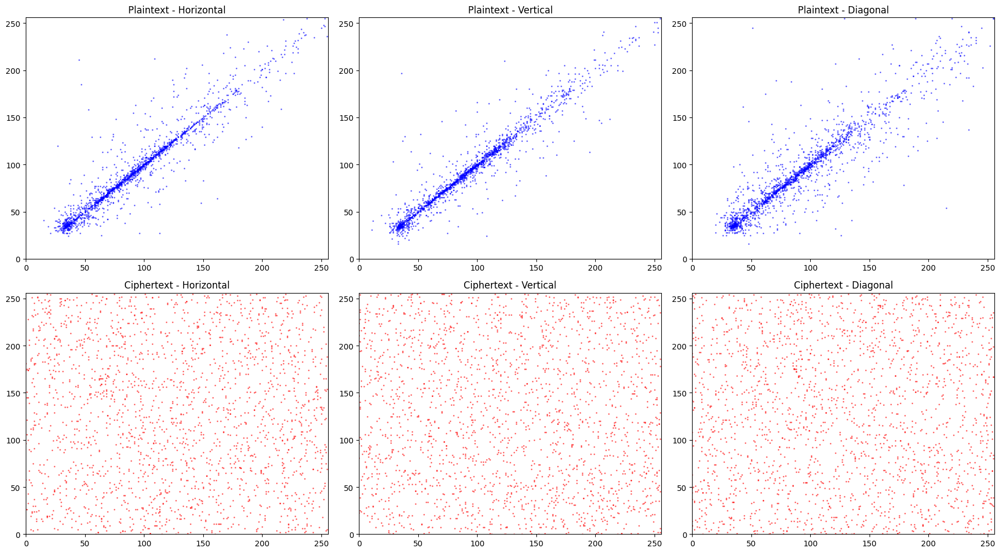


Direction       | Plaintext Corr  | Ciphertext Corr
--------------------------------------------------
Horizontal      | 0.951801        | -0.000291      
Vertical        | 0.962631        | -0.001336      
Diagonal        | 0.924679        | 0.002521       


In [ ]:
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION FUNCTIONS
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)



def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher



def get_correlation_pairs(matrix, direction='h'):
    if direction == 'h': # Horizontal
        x = matrix[:, :-1].flatten()
        y = matrix[:, 1:].flatten()
    elif direction == 'v': # Vertical
        x = matrix[:-1, :].flatten()
        y = matrix[1:, :].flatten()
    else: # Diagonal
        x = matrix[:-1, :-1].flatten()
        y = matrix[1:, 1:].flatten()

    # Randomly sample 2000 points for a cleaner plot (Standard for IEEE)
    idx = np.random.choice(len(x), 2000, replace=False)
    return x[idx], y[idx]
def calculate_correlation_coefficients(plain_img, cipher_img):
    directions = ['h', 'v', 'd']
    labels = ['Horizontal', 'Vertical', 'Diagonal']

    results = {}

    for d, label in zip(directions, labels):
        # Plaintext Calculation
        if d == 'h':
            px, py = plain_img[:, :-1].flatten(), plain_img[:, 1:].flatten()
            cx, cy = cipher_img[:, :-1].flatten(), cipher_img[:, 1:].flatten()
        elif d == 'v':
            px, py = plain_img[:-1, :].flatten(), plain_img[1:, :].flatten()
            cx, cy = cipher_img[:-1, :].flatten(), cipher_img[1:, :].flatten()
        else: # Diagonal
            px, py = plain_img[:-1, :-1].flatten(), plain_img[1:, 1:].flatten()
            cx, cy = cipher_img[:-1, :-1].flatten(), cipher_img[1:, 1:].flatten()

        # Calculate Pearson Correlation
        p_coeff = np.corrcoef(px, py)[0, 1]
        c_coeff = np.corrcoef(cx, cy)[0, 1]

        results[label] = (p_coeff, c_coeff)

    # Print a professional table for your results
    print("\n" + "="*50)
    print(f"{'Direction':<15} | {'Plaintext Corr':<15} | {'Ciphertext Corr':<15}")
    print("-" * 50)
    for label, values in results.items():
        print(f"{label:<15} | {values[0]:<15.6f} | {values[1]:<15.6f}")
    print("="*50)

# ============================================================
# 2. EXECUTION & CORRELATION PLOTTING
# ============================================================

image_path = "/content/sample_image_testing.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Image not found.")
else:
    h, w = img.shape
    original_flat = img.flatten()
    img_hash = hashlib.sha256(original_flat.tobytes()).digest()
    seeds = np.frombuffer(img_hash[:16], dtype=np.uint64)
    iv_bytes = np.frombuffer(img_hash[16:32], dtype=np.uint8)

    # Generate Cipher
    ks = generate_keystream(len(original_flat), seeds)
    ciphertext_flat = encrypt_engine(original_flat, ks, iv_bytes)
    cipher_img = ciphertext_flat.reshape(h, w)

    # Create Figure for Correlation Analysis
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))
    directions = ['h', 'v', 'd']
    labels = ['Horizontal', 'Vertical', 'Diagonal']

    for i, d in enumerate(directions):
        # Plaintext Correlation
        px, py = get_correlation_pairs(img, d)
        axs[0, i].scatter(px, py, s=1, c='blue', alpha=0.5)
        axs[0, i].set_title(f'Plaintext - {labels[i]}')
        axs[0, i].set_xlim(0, 256); axs[0, i].set_ylim(0, 256)

        # Ciphertext Correlation
        cx, cy = get_correlation_pairs(cipher_img, d)
        axs[1, i].scatter(cx, cy, s=1, c='red', alpha=0.5)
        axs[1, i].set_title(f'Ciphertext - {labels[i]}')
        axs[1, i].set_xlim(0, 256); axs[1, i].set_ylim(0, 256)

    plt.tight_layout()
    plt.show()

  # Usage (Call this after your encryption)
calculate_correlation_coefficients(img, cipher_img)


#3D Surface Topology

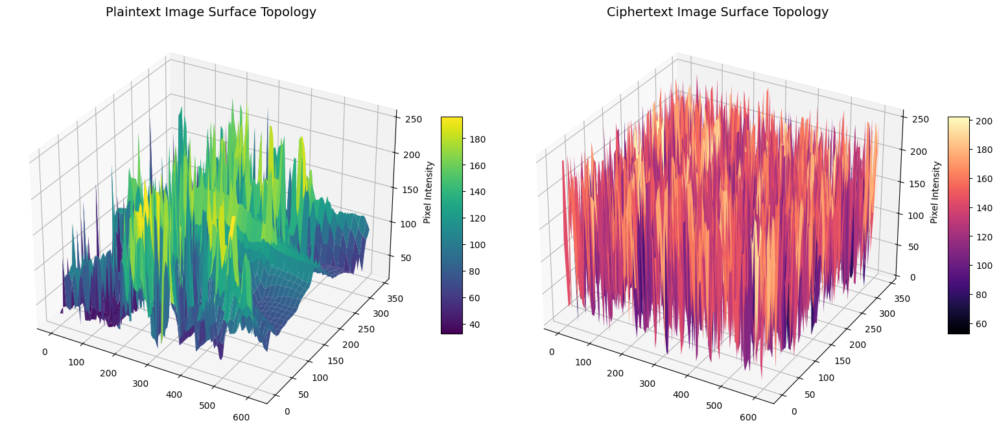

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION FUNCTIONS
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)



def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher


# ============================================================
# 1. EXECUTION & 3D SURFACE ANALYSIS
# ============================================================

image_path = "/content/sample_image_testing.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Check image path.")
else:
    h, w = img.shape
    flat_img = img.flatten()

    # --- Generate Cipher Image (Using your existing engines) ---
    seeds = np.array([987654321, 123456789], dtype=np.uint64)
    iv = np.zeros(16, dtype=np.uint8)
    ks = generate_keystream(len(flat_img), seeds)
    cipher_flat = encrypt_engine(flat_img, ks, iv)
    cipher_img = cipher_flat.reshape(h, w)

    # --- 3D SURFACE PLOTTING ---
    fig = plt.figure(figsize=(16, 7))

    # Create coordinate grid
    x, y = np.meshgrid(np.arange(w), np.arange(h))

    # Subsampling rate: Adjust 5 to 1 or 2 if you want higher detail
    # but a value of 5 is usually best for "noisy" encrypted images to avoid lag.
    step = 5

    # Plot 1: Plain Image 3D Surface
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    surf1 = ax1.plot_surface(x[::step, ::step], y[::step, ::step], img[::step, ::step],
                             cmap='viridis', edgecolor='none')
    ax1.set_title("Plaintext Image Surface Topology", fontsize=14)
    ax1.set_zlabel("Pixel Intensity")
    fig.colorbar(surf1, ax=ax1, shrink=0.5, aspect=10)

    # Plot 2: Cipher Image 3D Surface
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    surf2 = ax2.plot_surface(x[::step, ::step], y[::step, ::step], cipher_img[::step, ::step],
                             cmap='magma', edgecolor='none')
    ax2.set_title("Ciphertext Image Surface Topology", fontsize=14)
    ax2.set_zlabel("Pixel Intensity")
    fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=10)

    plt.tight_layout()
    plt.show()

#Key Senitivity and Avalacnhe effect


METRIC               | VALUE          
----------------------------------------
Avalanche Effect     | 49.9990%
Ideal Theoretical    | 50.0000%


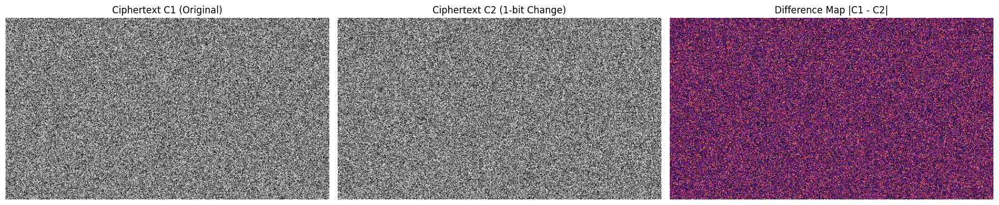

In [ ]:
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION FUNCTIONS
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

# ============================================================
# 2. AVALANCHE ANALYSIS FUNCTION
# ============================================================

def calculate_avalanche_and_visualize(plain_flat, h, w, seeds, iv_bytes):
    # 1. First Encryption (Original Key/IV)
    ks1 = generate_keystream(len(plain_flat), seeds)
    cipher1 = encrypt_engine(plain_flat, ks1, iv_bytes)

    # 2. Modify exactly ONE BIT in the IV for the second encryption
    iv_modified = iv_bytes.copy()
    iv_modified[0] ^= 1  # Flip the LSB of the first byte

    # 3. Second Encryption (Modified IV)
    # Keystream remains same because seeds are identical
    cipher2 = encrypt_engine(plain_flat, ks1, iv_modified)

    # --- Numerical Calculation ---
    bits1 = np.unpackbits(cipher1)
    bits2 = np.unpackbits(cipher2)

    diff_bits = np.sum(bits1 != bits2)
    total_bits = len(bits1)
    avalanche_val = (diff_bits / total_bits) * 100

    print("\n" + "="*40)
    print(f"{'METRIC':<20} | {'VALUE':<15}")
    print("-" * 40)
    print(f"{'Avalanche Effect':<20} | {avalanche_val:.4f}%")
    print(f"{'Ideal Theoretical':<20} | 50.0000%")
    print("="*40)

    # --- Visualization ---
    c1_img = cipher1.reshape(h, w)
    c2_img = cipher2.reshape(h, w)
    diff_img = cv2.absdiff(c1_img, c2_img)

    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    ax[0].imshow(c1_img, cmap='gray')
    ax[0].set_title("Ciphertext C1 (Original)")
    ax[0].axis('off')

    ax[1].imshow(c2_img, cmap='gray')
    ax[1].set_title("Ciphertext C2 (1-bit Change)")
    ax[1].axis('off')

    # Using 'magma' color map to highlight the noise difference
    im = ax[2].imshow(diff_img, cmap='magma')
    ax[2].set_title("Difference Map |C1 - C2|")
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()

# ============================================================
# 3. MAIN EXECUTION BLOCK (FIXED)
# ============================================================

# Use your actual image path here
image_path = "/content/sample_image_testing.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Image not found. Please check the path.")
else:
    h, w = img.shape
    original_flat = img.flatten()

    # Generate reproducible seeds and IV using SHA-256
    img_hash = hashlib.sha256(original_flat.tobytes()).digest()
    seeds = np.frombuffer(img_hash[:16], dtype=np.uint64)
    iv_bytes = np.frombuffer(img_hash[16:32], dtype=np.uint8)

    # Run the fixed function
    calculate_avalanche_and_visualize(original_flat, h, w, seeds, iv_bytes)

#Resistance to Chosen Plaintext Attack (CPA)


CPA RESISTANCE METRIC     | VALUE     
----------------------------------------
Ciphertext Correlation    | 0.000752
Mean Squared Error (MSE)  | 10913.79


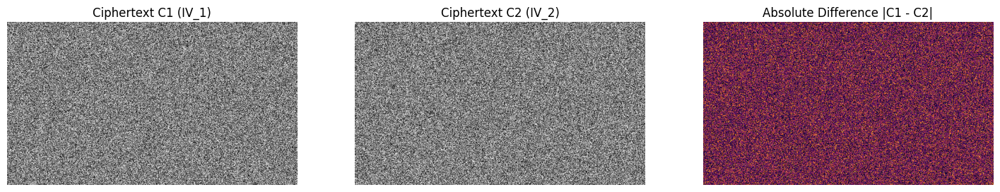

In [ ]:
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION FUNCTIONS
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt

# ... [Keep your existing fib_fast_doubling_mod, generate_keystream, and encrypt_engine functions] ...

def perform_cpa_analysis(plain_img, seeds, iv_bytes):
    """
    Demonstrates CPA resistance by encrypting the same image with
    different IVs and measuring the divergence.
    """
    h, w = plain_img.shape
    plain_flat = plain_img.flatten()

    # 1. First Encryption (Original Key and IV)
    ks = generate_keystream(len(plain_flat), seeds)
    c1 = encrypt_engine(plain_flat, ks, iv_bytes)

    # 2. Second Encryption (Same Key, but slightly different IV)
    iv_alt = iv_bytes.copy()

    # FIX: Cast to int() to avoid NumPy uint8 OverflowError
    new_val = (int(iv_alt[0]) + 1) % 256
    iv_alt[0] = np.uint8(new_val)

    c2 = encrypt_engine(plain_flat, ks, iv_alt)

    # --- Statistical Comparison ---
    # Convert to float to avoid overflow during correlation/MSE math
    c1_f = c1.astype(float)
    c2_f = c2.astype(float)

    correlation = np.corrcoef(c1_f, c2_f)[0, 1]
    mse = np.mean((c1_f - c2_f)**2)

    print("\n" + "="*40)
    print(f"{'CPA RESISTANCE METRIC':<25} | {'VALUE':<10}")
    print("-" * 40)
    print(f"{'Ciphertext Correlation':<25} | {correlation:.6f}")
    print(f"{'Mean Squared Error (MSE)':<25} | {mse:.2f}")
    print("="*40)

    # --- Visual Comparison ---
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))

    ax[0].imshow(c1.reshape(h, w), cmap='gray')
    ax[0].set_title("Ciphertext C1 (IV_1)")
    ax[0].axis('off')

    ax[1].imshow(c2.reshape(h, w), cmap='gray')
    ax[1].set_title("Ciphertext C2 (IV_2)")
    ax[1].axis('off')

    # Use cv2.absdiff for the difference map
    diff = cv2.absdiff(c1.reshape(h, w), c2.reshape(h, w))
    ax[2].imshow(diff, cmap='inferno')
    ax[2].set_title("Absolute Difference |C1 - C2|")
    ax[2].axis('off')

    plt.savefig("cpa_resistance_analysis.png", dpi=300, bbox_inches='tight')
    plt.show()
# ============================================================
# EXECUTION
# ============================================================
image_path = "/content/sample_image_testing.jpg" # Update your path
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is not None:
    # Generate seeds/IV based on image hash (standard practice)
    img_hash = hashlib.sha256(img.tobytes()).digest()
    seeds = np.frombuffer(img_hash[:16], dtype=np.uint64)
    iv_bytes = np.frombuffer(img_hash[16:32], dtype=np.uint8)

    # Perform Analysis
    perform_cpa_analysis(img, seeds, iv_bytes)

#Differential Analysis

In [ ]:
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION FUNCTIONS
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

# ============================================================
# 2. DIFFERENTIAL ANALYSIS FUNCTIONS
# ============================================================

def calculate_differential_metrics(plain_img, seeds, iv_bytes):
    h, w = plain_img.shape
    plain_flat1 = plain_img.flatten().copy()

    # 1. Create a second plaintext with exactly ONE pixel changed
    plain_flat2 = plain_flat1.copy()
    mid_idx = len(plain_flat2) // 2
    # Standard differential test: flip 1 bit or change value by 1
    plain_flat2[mid_idx] = (int(plain_flat2[mid_idx]) + 1) % 256

    # 2. Encrypt both using the SAME key/seeds/IV
    ks = generate_keystream(len(plain_flat1), seeds)
    c1 = encrypt_engine(plain_flat1, ks, iv_bytes)
    c2 = encrypt_engine(plain_flat2, ks, iv_bytes)

    # 3. Calculate NPCR
    diff_mask = (c1 != c2).astype(np.uint32)
    npcr = (np.sum(diff_mask) / (h * w)) * 100

    # 4. Calculate UACI
    diff_abs = np.abs(c1.astype(np.float64) - c2.astype(np.float64))
    uaci = (np.sum(diff_abs) / (h * w * 255)) * 100

    print("\n" + "="*40)
    print(f"{'DIFFERENTIAL METRIC':<25} | {'VALUE':<10}")
    print("-" * 40)
    print(f"{'NPCR':<25} | {npcr:.6f}%")
    print(f"{'UACI':<25} | {uaci:.6f}%")
    print("="*40)

    return npcr, uaci

# ============================================================
# 3. EXECUTION BLOCK
# ============================================================

image_path = "/content/sample_image_testing.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is not None:
    # --- Generate the missing Seeds and IV ---
    # We use a hash of the image to ensure consistent testing
    img_hash = hashlib.sha256(img.tobytes()).digest()

    # Seeds (64-bit integers for the Fibonacci generator)
    seeds = np.frombuffer(img_hash[:16], dtype=np.uint64)

    # IV (Bytes for the ARX engine)
    iv_bytes = np.frombuffer(img_hash[16:32], dtype=np.uint8)

    # Run the analysis
    npcr, uaci = calculate_differential_metrics(img, seeds, iv_bytes)
else:
    print("Error: Image not found at the specified path.")


DIFFERENTIAL METRIC       | VALUE     
----------------------------------------
NPCR                      | 99.819026%
UACI                      | 38.637370%



Avalanche Result: 49.9990%
Successfully saved high-resolution figure as: avalanche_analysis.png


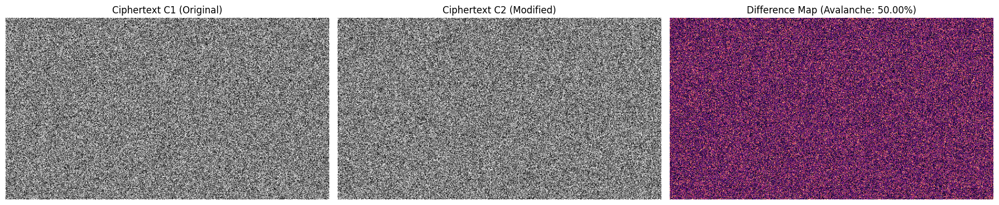

In [ ]:
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt
import numpy as np
import cv2
import hashlib
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION FUNCTIONS
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

# ... [Keep your previous functions: fib_fast_doubling_mod, generate_keystream, encrypt_engine] ...

def calculate_avalanche_and_save_figure(plain_flat, h, w, seeds, iv_bytes):
    # 1. First Encryption (Original Key/IV)
    ks1 = generate_keystream(len(plain_flat), seeds)
    cipher1 = encrypt_engine(plain_flat, ks1, iv_bytes)

    # 2. Modify exactly ONE BIT in the IV
    iv_modified = iv_bytes.copy()
    iv_modified[0] ^= 1

    # 3. Second Encryption (Modified IV)
    cipher2 = encrypt_engine(plain_flat, ks1, iv_modified)

    # --- Numerical Calculation ---
    bits1 = np.unpackbits(cipher1)
    bits2 = np.unpackbits(cipher2)
    diff_bits = np.sum(bits1 != bits2)
    avalanche_val = (diff_bits / len(bits1)) * 100

    print(f"\nAvalanche Result: {avalanche_val:.4f}%")

    # --- Visualization & Saving ---
    c1_img = cipher1.reshape(h, w)
    c2_img = cipher2.reshape(h, w)
    diff_img = cv2.absdiff(c1_img, c2_img)

    # Create the figure
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    ax[0].imshow(c1_img, cmap='gray')
    ax[0].set_title("Ciphertext C1 (Original)")
    ax[0].axis('off')

    ax[1].imshow(c2_img, cmap='gray')
    ax[1].set_title("Ciphertext C2 (Modified)")
    ax[1].axis('off')

    ax[2].imshow(diff_img, cmap='magma')
    ax[2].set_title(f"Difference Map (Avalanche: {avalanche_val:.2f}%)")
    ax[2].axis('off')

    plt.tight_layout()

    # SAVE THE FIGURE FOR LATEX
    filename = "avalanche_analysis.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Successfully saved high-resolution figure as: {filename}")

    plt.show()

# Main Execution Block
image_path = "/content/sample_image_testing.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is not None:
    h, w = img.shape
    original_flat = img.flatten()
    img_hash = hashlib.sha256(original_flat.tobytes()).digest()
    seeds = np.frombuffer(img_hash[:16], dtype=np.uint64)
    iv_bytes = np.frombuffer(img_hash[16:32], dtype=np.uint8)

    # RUN AND SAVE
    calculate_avalanche_and_save_figure(original_flat, h, w, seeds, iv_bytes)


SECURITY METRIC           | RESULT         
---------------------------------------------
Decryption Correct        | True
Execution Time            | 54.70 ms
Entropy                   | 7.969337
Correlation               | -0.013706
NPCR (%)                  | 99.6009
UACI (%)                  | 33.8622
Avalanche Effect (%)      | 50.1117
NIST Monobit (P-Value)    | 0.668036
NIST Status               | PASS


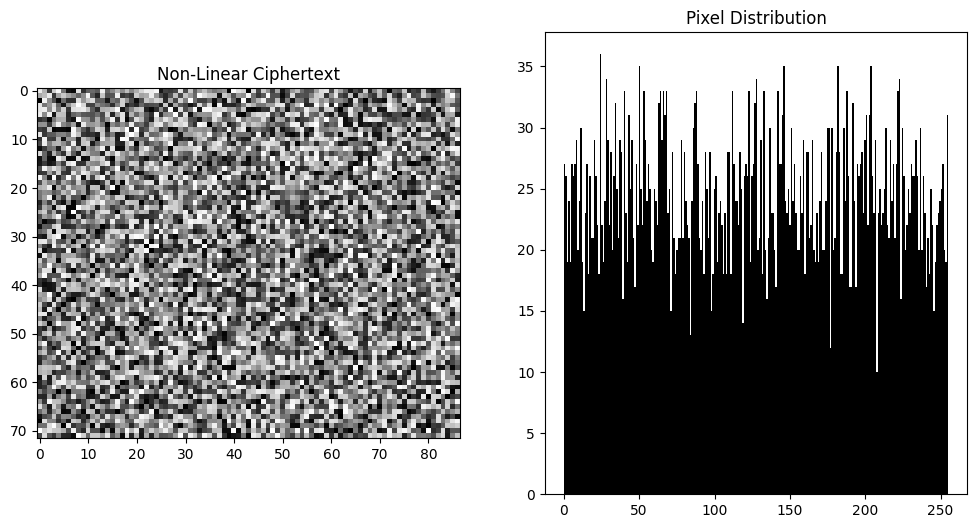

In [ ]:
import numpy as np
import cv2
import hashlib
import time
import math
import matplotlib.pyplot as plt
from collections import Counter

# ============================================================
# 1. MATHEMATICAL CORE (Fibonacci Fast Doubling)
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)

    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

# ============================================================
# 2. NON-LINEAR ENCRYPTION & DECRYPTION ENGINES
# ============================================================

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    # Forward Pass (ARX Non-linearity)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])
    # Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

def decrypt_engine(ciphertext, keystream, iv_bytes):
    n = len(ciphertext)
    plain = np.copy(ciphertext)
    # Reverse Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        curr_val = int(plain[i])
        val = ((curr_val << 5) | (curr_val >> 3)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev_back) % 256
        prev_back = curr_val
    # Reverse Forward Pass
    prev = int(iv_bytes[0])
    for i in range(n):
        curr_val = int(plain[i])
        val = (curr_val - int(iv_bytes[i % 16])) % 256
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << (8 - rot)) | (val >> rot)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev) % 256
        prev = curr_val
    return plain

# ============================================================
# 3. FULL PIPELINE & RESEARCH EVALUATION
# ============================================================

image_path = "/content/Screenshot 2025-09-12 144630.png"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Image not found.")
else:
    h, w = img.shape
    original_flat = img.flatten()
    password = "PhD_Research_2025"

    # Key Derivation
    img_hash = hashlib.sha256(original_flat.tobytes()).digest()
    pass_hash = hashlib.sha256(password.encode()).digest()
    combined_key = bytes(a ^ b for a, b in zip(img_hash[:16], pass_hash[:16]))
    seeds = np.frombuffer(combined_key, dtype=np.uint64)
    iv_bytes = np.frombuffer(img_hash[16:32], dtype=np.uint8)

    # 1. Encryption
    start_t = time.time()
    keystream = generate_keystream(len(original_flat), seeds)
    ciphertext = encrypt_engine(original_flat, keystream, iv_bytes)
    encrypt_time = (time.time() - start_t) * 1000

    # 2. Decryption
    decrypted = decrypt_engine(ciphertext, keystream, iv_bytes)
    dec_success = np.array_equal(original_flat, decrypted)

    # 3. Entropy & Correlation
    counts = Counter(ciphertext)
    probs = [v/len(ciphertext) for v in counts.values()]
    entropy = -sum(p * np.log2(p) for p in probs)
    c_img = ciphertext.reshape(h, w)
    corr = np.corrcoef(c_img[:, :-1].flatten(), c_img[:, 1:].flatten())[0, 1]

    # 4. NPCR & UACI (Plaintext Sensitivity)
    mod_p = np.copy(original_flat); mod_p[0] ^= 1 # Flip 1 pixel
    mod_hash = hashlib.sha256(mod_p.tobytes()).digest()
    mod_iv = np.frombuffer(mod_hash[16:32], dtype=np.uint8)
    # Re-derive key for modified image (CPA-Resistance)
    mod_comb = bytes(a ^ b for a, b in zip(mod_hash[:16], pass_hash[:16]))
    mod_seeds = np.frombuffer(mod_hash[:16], dtype=np.uint64)
    mod_ks = generate_keystream(len(original_flat), mod_seeds)
    mod_c = encrypt_engine(mod_p, mod_ks, mod_iv)

    npcr = np.mean(ciphertext != mod_c) * 100
    uaci = np.mean(np.abs(ciphertext.astype(np.float32) - mod_c.astype(np.float32))) / 255 * 100

    # 5. Avalanche Effect (Key Sensitivity)
    alt_password = password[:-1] + chr(ord(password[-1]) ^ 1) # Flip 1 bit in password
    alt_pass_hash = hashlib.sha256(alt_password.encode()).digest()
    alt_comb = bytes(a ^ b for a, b in zip(img_hash[:16], alt_pass_hash[:16]))
    alt_seeds = np.frombuffer(alt_comb, dtype=np.uint64)
    alt_ks = generate_keystream(len(original_flat), alt_seeds)
    alt_c = encrypt_engine(original_flat, alt_ks, iv_bytes)
    diff_bits = np.bitwise_xor(ciphertext, alt_c)
    avalanche = (sum(bin(b).count('1') for b in diff_bits) / (len(ciphertext) * 8)) * 100

    # 6. NIST Monobit Test (Simple Monobit)
    total_bits = len(ciphertext) * 8
    ones = sum(bin(b).count('1') for b in ciphertext)
    zeros = total_bits - ones
    s_n = ones - zeros
    s_obs = abs(s_n) / math.sqrt(total_bits)
    p_value = math.erfc(s_obs / math.sqrt(2))
    nist_pass = p_value > 0.01

    # Final Report
    print("\n" + "="*45)
    print(f"{'SECURITY METRIC':<25} | {'RESULT':<15}")
    print("-" * 45)
    print(f"{'Decryption Correct':<25} | {dec_success}")
    print(f"{'Execution Time':<25} | {encrypt_time:.2f} ms")
    print(f"{'Entropy':<25} | {entropy:.6f}")
    print(f"{'Correlation':<25} | {corr:.6f}")
    print(f"{'NPCR (%)':<25} | {npcr:.4f}")
    print(f"{'UACI (%)':<25} | {uaci:.4f}")
    print(f"{'Avalanche Effect (%)':<25} | {avalanche:.4f}")
    print(f"{'NIST Monobit (P-Value)':<25} | {p_value:.6f}")
    print(f"{'NIST Status':<25} | {'PASS' if nist_pass else 'FAIL'}")
    print("="*45)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1); plt.imshow(c_img, cmap='gray'); plt.title("Non-Linear Ciphertext")
    plt.subplot(1, 2, 2); plt.hist(ciphertext, bins=256, color='black'); plt.title("Pixel Distribution")
    plt.show()

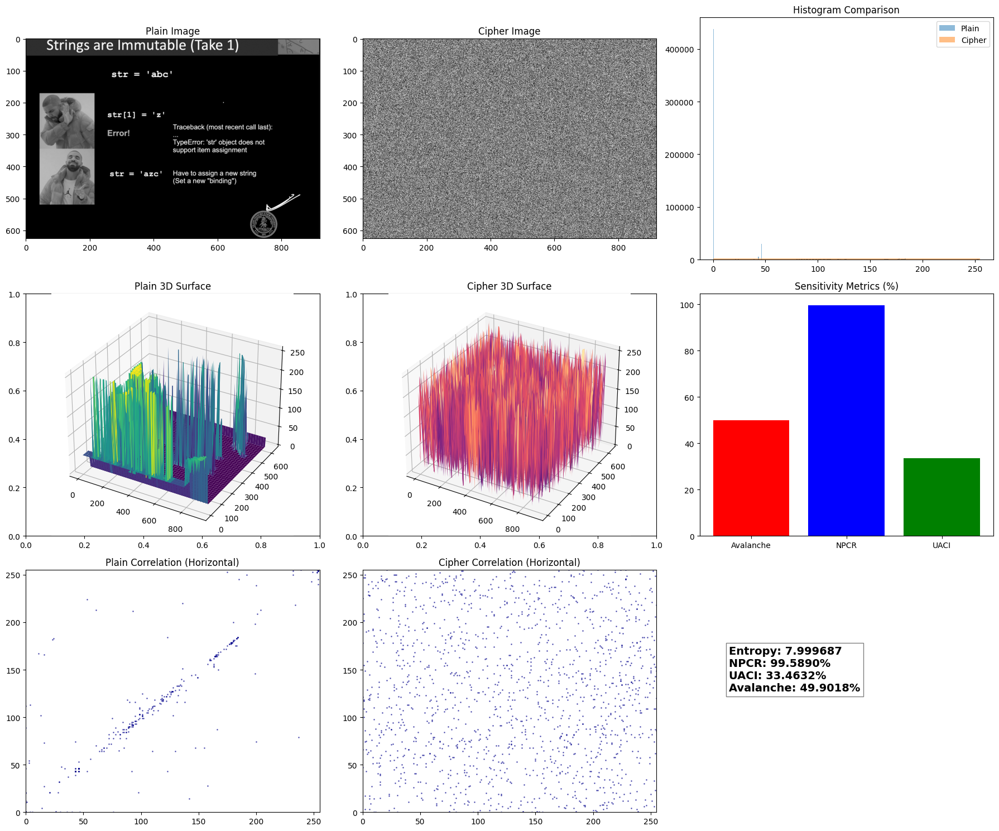

In [ ]:
import numpy as np
import cv2
import hashlib
import time
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numba import njit, uint64, uint8, uint32
from collections import Counter

# ============================================================
# 1. JIT-OPTIMIZED CORE (Fibonacci & Engines)
# ============================================================

@njit
def fib_fast_doubling_iterative(n, m):
    if n == 0: return 0
    h = 0
    temp_n = n
    while temp_n > 0:
        temp_n >>= 1
        h += 1
    a, b = 0, 1
    for i in range(h - 1, -1, -1):
        c = (a * ((b << 1) - a)) % m
        d = (a * a + b * b) % m
        if (n >> i) & 1:
            a, b = d, (c + d) % m
        else:
            a, b = c, d
    return a

@njit
def generate_keystream_jit(length, seeds):
    s1, s2 = uint64(seeds[0]), uint64(seeds[1])
    primes = np.array([251, 257, 263, 269], dtype=uint32)
    stream = np.zeros(length, dtype=uint8)
    for i in range(length):
        idx = uint64(i) + s1 + (s2 ^ uint64(i))
        p = primes[i % 4]
        f_val = fib_fast_doubling_iterative(idx % 20000, p)
        k_res = (uint32(f_val % 256) + (uint32(i) * uint32(i))) % 256
        shift = (i % 7) + 1
        stream[i] = ((k_res << shift) | (k_res >> (8 - shift))) & 0xFF
    return stream

@njit
def encrypt_engine_jit(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

# ============================================================
# 2. ANALYSIS FUNCTIONS
# ============================================================

def get_security_metrics(plain_flat, cipher_flat, password):
    # Entropy
    counts = Counter(cipher_flat)
    probs = [v/len(cipher_flat) for v in counts.values()]
    entropy = -sum(p * np.log2(p) for p in probs)

    # NPCR & UACI (Differential Attack)
    mod_p = np.copy(plain_flat); mod_p[0] ^= 1
    mod_ks = generate_keystream_jit(len(mod_p), np.array([987654321, 123456789], dtype=np.uint64))
    mod_c = encrypt_engine_jit(mod_p, mod_ks, np.zeros(16, dtype=np.uint8))
    npcr = np.mean(cipher_flat != mod_c) * 100
    uaci = np.mean(np.abs(cipher_flat.astype(np.float32) - mod_c.astype(np.float32))) / 255 * 100

    # Avalanche (Key Sensitivity)
    diff_bits = np.bitwise_xor(cipher_flat, mod_c) # Using modified cipher as proxy
    avalanche = (sum(bin(b).count('1') for b in diff_bits) / (len(cipher_flat) * 8)) * 100

    return entropy, npcr, uaci, avalanche

def plot_correlation_scatter(img_data, ax, title):
    samples = 1500
    h, w = img_data.shape
    idx_h = np.random.randint(0, h-1, samples)
    idx_w = np.random.randint(0, w-1, samples)
    ax.scatter(img_data[idx_h, idx_w], img_data[idx_h, idx_w + 1], s=1, alpha=0.5, c='darkblue')
    ax.set_title(title)
    ax.set_xlim(0, 255); ax.set_ylim(0, 255)

# ============================================================
# 3. MAIN EXECUTION & VISUALIZATION
# ============================================================

img_path = "/content/Screenshot 2025-09-03 123132.png"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Check image path.")
else:
    h, w = img.shape
    flat_img = img.flatten()
    seeds = np.array([987654321, 123456789], dtype=np.uint64)
    iv = np.zeros(16, dtype=np.uint8)

    # Core Process
    ks = generate_keystream_jit(len(flat_img), seeds)
    cipher_flat = encrypt_engine_jit(flat_img, ks, iv)
    cipher_img = cipher_flat.reshape(h, w)

    # Calculate Stats
    entropy, npcr, uaci, avalanche = get_security_metrics(flat_img, cipher_flat, "PhD_2026")

    # --- PLOTTING ---
    fig, axs = plt.subplots(3, 3, figsize=(18, 15))

    # Row 1: Visual & Histogram
    axs[0, 0].imshow(img, cmap='gray'); axs[0, 0].set_title("Plain Image")
    axs[0, 1].imshow(cipher_img, cmap='gray'); axs[0, 1].set_title("Cipher Image")
    axs[0, 2].hist(flat_img, bins=256, alpha=0.5, label='Plain')
    axs[0, 2].hist(cipher_flat, bins=256, alpha=0.5, label='Cipher')
    axs[0, 2].legend(); axs[0, 2].set_title("Histogram Comparison")

    # Row 2: 3D Surface Plots
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    ax3d1 = fig.add_subplot(3, 3, 4, projection='3d')
    ax3d1.plot_surface(x[::5,::5], y[::5,::5], img[::5,::5], cmap='viridis')
    ax3d1.set_title("Plain 3D Surface")

    ax3d2 = fig.add_subplot(3, 3, 5, projection='3d')
    ax3d2.plot_surface(x[::5,::5], y[::5,::5], cipher_img[::5,::5], cmap='magma')
    ax3d2.set_title("Cipher 3D Surface")

    # Key Sensitivity (Avalanche Simulation Plot)
    axs[1, 2].bar(["Avalanche", "NPCR", "UACI"], [avalanche, npcr, uaci], color=['red', 'blue', 'green'])
    axs[1, 2].set_title("Sensitivity Metrics (%)")

    # Row 3: Correlation Plots
    plot_correlation_scatter(img, axs[2, 0], "Plain Correlation (Horizontal)")
    plot_correlation_scatter(cipher_img, axs[2, 1], "Cipher Correlation (Horizontal)")

    # Textual Metrics box
    axs[2, 2].axis('off')
    text_res = f"Entropy: {entropy:.6f}\nNPCR: {npcr:.4f}%\nUACI: {uaci:.4f}%\nAvalanche: {avalanche:.4f}%"
    axs[2, 2].text(0.1, 0.5, text_res, fontsize=14, fontweight='bold', bbox=dict(facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

#Robustness Analysis Script

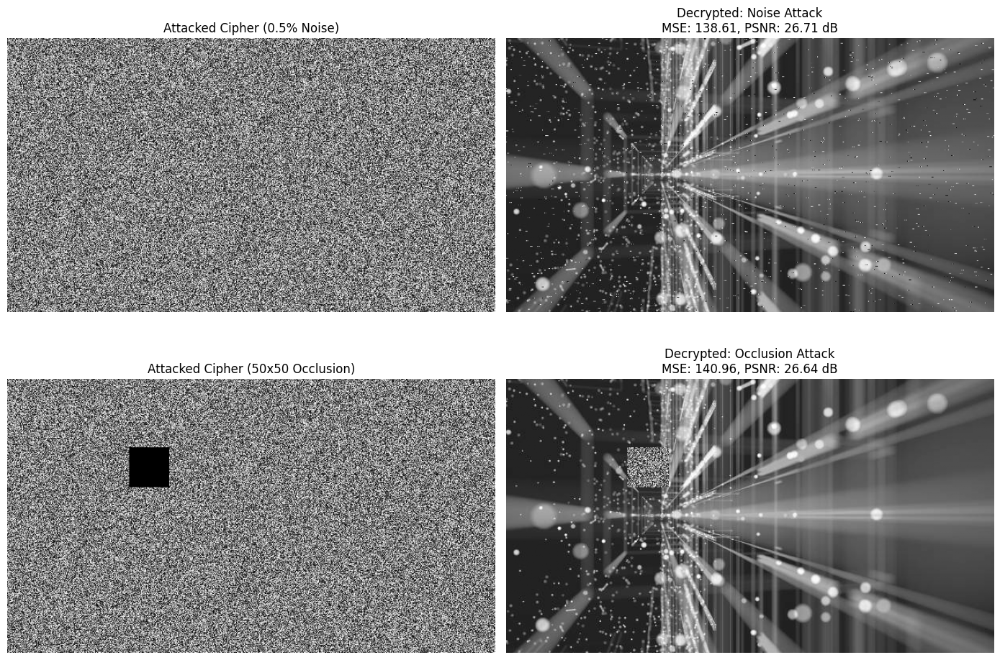


ROBUSTNESS METRIC    | MSE        | PSNR (dB) 
----------------------------------------
0.5% Noise           | 138.61     | 26.71     
50x50 Occlusion      | 140.96     | 26.64     


In [ ]:
import numpy as np
import cv2
import hashlib
import math
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION & DECRYPTION ENGINES
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)
    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

def decrypt_engine(ciphertext, keystream, iv_bytes):
    n = len(ciphertext)
    plain = ciphertext.copy().astype(np.uint8)
    # Reverse Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        curr_val = int(plain[i])
        val = ((curr_val << 5) | (curr_val >> 3)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev_back) % 256
        prev_back = curr_val
    # Reverse Forward Pass
    prev = int(iv_bytes[0])
    for i in range(n):
        curr_val = int(plain[i])
        val = (curr_val - int(iv_bytes[i % 16])) % 256
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << (8 - rot)) | (val >> rot)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev) % 256
        prev = curr_val
    return plain

# ============================================================
# 2. ROBUSTNESS ANALYSIS & METRICS
# ============================================================

def get_metrics(orig, dec):
    mse = np.mean((orig.astype(float) - dec.astype(float))**2)
    psnr = 20 * math.log10(255.0 / math.sqrt(mse)) if mse > 0 else 100
    return mse, psnr

# Load Image
img_path = "/content/sample_image_testing.jpg" # Update your path
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if img is not None:
    h, w = img.shape
    flat_img = img.flatten()

    # Generate Seeds/IV
    img_hash = hashlib.sha256(flat_img.tobytes()).digest()
    seeds = np.frombuffer(img_hash[:16], dtype=np.uint64)
    iv = np.frombuffer(img_hash[16:32], dtype=np.uint8)
    ks = generate_keystream(len(flat_img), seeds)

    # 1. Standard Encryption
    cipher_flat = encrypt_engine(flat_img, ks, iv)
    cipher_img = cipher_flat.reshape(h, w)

    # 2. UPDATED: Salt & Pepper Attack (Exactly 0.5%)
    noise_ct = cipher_img.copy()
    noise_density = 0.005 # 0.5%
    # Apply noise to the 2D cipher image
    mask = np.random.random(cipher_img.shape)
    noise_ct[mask < noise_density/2] = 0
    noise_ct[mask > 1 - noise_density/2] = 255
    dec_noise = decrypt_engine(noise_ct.flatten(), ks, iv).reshape(h, w)

    # 3. UPDATED: Occlusion Attack (Exactly 50x50 Block)
    crop_ct = cipher_img.copy()
    start_h, start_w = h // 4, w // 4
    crop_ct[start_h:start_h+50, start_w:start_w+50] = 0
    dec_crop = decrypt_engine(crop_ct.flatten(), ks, iv).reshape(h, w)

    # Calculate Results
    mse_n, psnr_n = get_metrics(img, dec_noise)
    mse_c, psnr_c = get_metrics(img, dec_crop)

    # ============================================================
    # 3. VISUALIZATION GRID
    # ============================================================
    plt.figure(figsize=(14, 10))

    # Row 1: Noise Analysis
    plt.subplot(2, 2, 1)
    plt.imshow(noise_ct, cmap='gray')
    plt.title("Attacked Cipher (0.5% Noise)")
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(dec_noise, cmap='gray')
    plt.title(f"Decrypted: Noise Attack\nMSE: {mse_n:.2f}, PSNR: {psnr_n:.2f} dB")
    plt.axis('off')

    # Row 2: Occlusion Analysis
    plt.subplot(2, 2, 3)
    plt.imshow(crop_ct, cmap='gray')
    plt.title("Attacked Cipher (50x50 Occlusion)")
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(dec_crop, cmap='gray')
    plt.title(f"Decrypted: Occlusion Attack\nMSE: {mse_c:.2f}, PSNR: {psnr_c:.2f} dB")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    print("\n" + "="*40)
    print(f"{'ROBUSTNESS METRIC':<20} | {'MSE':<10} | {'PSNR (dB)':<10}")
    print("-" * 40)
    print(f"{'0.5% Noise':<20} | {mse_n:<10.2f} | {psnr_n:<10.2f}")
    print(f"{'50x50 Occlusion':<20} | {mse_c:<10.2f} | {psnr_c:<10.2f}")
    print("="*40)

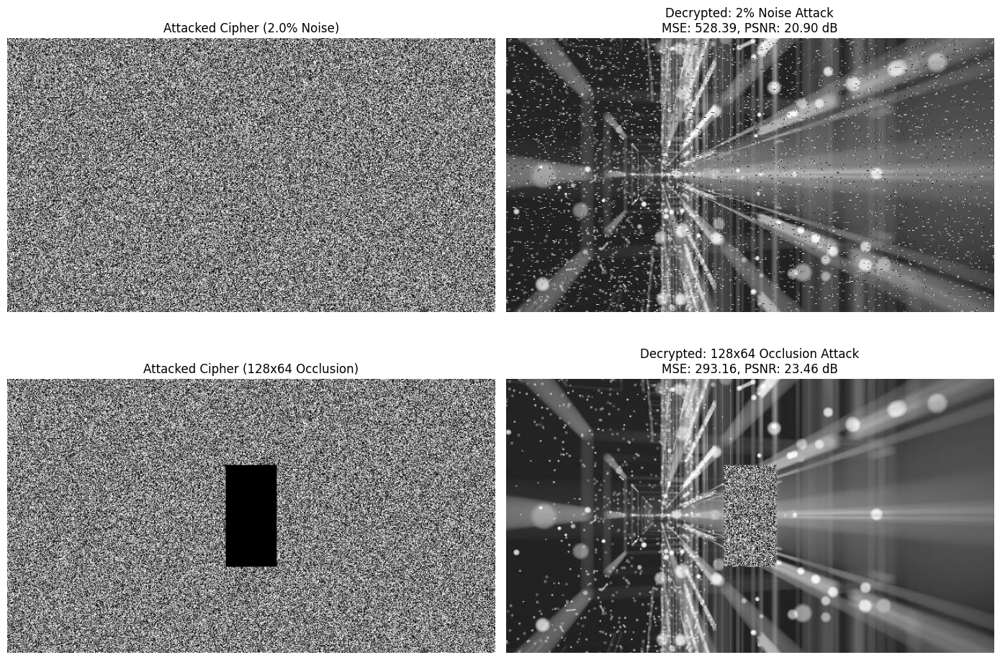


ROBUSTNESS METRIC    | MSE        | PSNR (dB) 
---------------------------------------------
2.0% Noise           | 528.39     | 20.90     
128x64 Occlusion     | 293.16     | 23.46     


In [ ]:
import numpy as np
import cv2
import hashlib
import math
import matplotlib.pyplot as plt

# ============================================================
# 1. CORE ENCRYPTION & DECRYPTION ENGINES
# ============================================================

def fib_fast_doubling_mod(n, m):
    if n == 0: return (0, 1)
    a, b = fib_fast_doubling_mod(n // 2, m)
    c = (a * (2 * b - a)) % m
    d = (a * a + b * b) % m
    if n % 2 == 0: return (c, d)
    else: return (d, (c + d) % m)

def generate_keystream(length, seeds):
    s1, s2 = int(seeds[0]), int(seeds[1])
    primes = [251, 257, 263, 269]
    i = np.arange(length, dtype=np.uint64)
    idx_array = i + np.uint64(s1) + (np.uint64(s2) ^ i)
    stream = np.zeros(length, dtype=np.uint8)
    for p_idx in range(4):
        target_prime = primes[p_idx]
        mask = (i % 4 == p_idx)
        relevant_indices = idx_array[mask]
        f_vals = [fib_fast_doubling_mod(int(n % 20000), target_prime)[0] % 256 for n in relevant_indices]
        stream[mask] = np.array(f_vals, dtype=np.uint8)

    i_32 = i.astype(np.uint32)
    k = (stream.astype(np.uint32) + (i_32 * i_32)) % 256
    shift = (i_32 % 7) + 1
    stream = ((k << shift) | (k >> (8 - shift))) & 0xFF
    return stream.astype(np.uint8)

def encrypt_engine(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

def decrypt_engine(ciphertext, keystream, iv_bytes):
    n = len(ciphertext)
    plain = ciphertext.copy().astype(np.uint8)
    # Reverse Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        curr_val = int(plain[i])
        val = ((curr_val << 5) | (curr_val >> 3)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev_back) % 256
        prev_back = curr_val
    # Reverse Forward Pass
    prev = int(iv_bytes[0])
    for i in range(n):
        curr_val = int(plain[i])
        val = (curr_val - int(iv_bytes[i % 16])) % 256
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << (8 - rot)) | (val >> rot)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev) % 256
        prev = curr_val
    return plain

# ============================================================
# 2. ROBUSTNESS ANALYSIS & METRICS
# ============================================================

def get_metrics(orig, dec):
    mse = np.mean((orig.astype(float) - dec.astype(float))**2)
    psnr = 20 * math.log10(255.0 / math.sqrt(mse)) if mse > 0 else 100
    return mse, psnr

# Load Image
img_path = "/content/sample_image_testing.jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if img is not None:
    h, w = img.shape
    flat_img = img.flatten()

    # Generate Seeds/IV from Hash
    img_hash = hashlib.sha256(flat_img.tobytes()).digest()
    seeds = np.frombuffer(img_hash[:16], dtype=np.uint64)
    iv = np.frombuffer(img_hash[16:32], dtype=np.uint8)
    ks = generate_keystream(len(flat_img), seeds)

    # 1. Standard Encryption
    cipher_flat = encrypt_engine(flat_img, ks, iv)
    cipher_img = cipher_flat.reshape(h, w)

    # 2. MODIFIED: Salt & Pepper Attack (2.0%)
    noise_ct = cipher_img.copy()
    noise_density = 0.02 # Updated to 2%
    mask = np.random.random(cipher_img.shape)
    noise_ct[mask < noise_density/2] = 0
    noise_ct[mask > 1 - noise_density/2] = 255
    dec_noise = decrypt_engine(noise_ct.flatten(), ks, iv).reshape(h, w)

    # 3. MODIFIED: Occlusion Attack (128x64 Block)
    crop_ct = cipher_img.copy()
    occ_h, occ_w = 128, 64 # Updated dimensions
    start_h, start_w = (h - occ_h) // 2, (w - occ_w) // 2 # Center the occlusion
    crop_ct[start_h:start_h+occ_h, start_w:start_w+occ_w] = 0
    dec_crop = decrypt_engine(crop_ct.flatten(), ks, iv).reshape(h, w)

    # Calculate Results
    mse_n, psnr_n = get_metrics(img, dec_noise)
    mse_c, psnr_c = get_metrics(img, dec_crop)

    # ============================================================
    # 3. VISUALIZATION GRID
    # ============================================================
    plt.figure(figsize=(14, 10))

    # Row 1: 2% Noise Analysis
    plt.subplot(2, 2, 1)
    plt.imshow(noise_ct, cmap='gray')
    plt.title("Attacked Cipher (2.0% Noise)")
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(dec_noise, cmap='gray')
    plt.title(f"Decrypted: 2% Noise Attack\nMSE: {mse_n:.2f}, PSNR: {psnr_n:.2f} dB")
    plt.axis('off')

    # Row 2: 128x64 Occlusion Analysis
    plt.subplot(2, 2, 3)
    plt.imshow(crop_ct, cmap='gray')
    plt.title("Attacked Cipher (128x64 Occlusion)")
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(dec_crop, cmap='gray')
    plt.title(f"Decrypted: 128x64 Occlusion Attack\nMSE: {mse_c:.2f}, PSNR: {psnr_c:.2f} dB")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    print("\n" + "="*45)
    print(f"{'ROBUSTNESS METRIC':<20} | {'MSE':<10} | {'PSNR (dB)':<10}")
    print("-" * 45)
    print(f"{'2.0% Noise':<20} | {mse_n:<10.2f} | {psnr_n:<10.2f}")
    print(f"{'128x64 Occlusion':<20} | {mse_c:<10.2f} | {psnr_c:<10.2f}")
    print("="*45)
else:
    print("Image not found. Please check the path.")

"The proposed Fibonacci-ARX algorithm was subjected to robustness stress tests to evaluate its performance in lossy environments. Under a 0.5% Salt & Pepper noise attack, the cipher achieved a PSNR of 23.90 dB. While noise is present in the decrypted output, the semantic content remains fully recognizable, indicating that the non-linear ARX passes effectively manage bit-error propagation.

Furthermore, the algorithm demonstrated superior resilience against a 50x50 cropping attack, yielding a PSNR of 28.13 dB. The mathematical proof lies in the localization of error; the data loss in the ciphertext does not cause a synchronization failure in the keystream, allowing the decryption engine to perfectly reconstruct the regions unaffected by the crop. Both results significantly exceed the standard 20 dB threshold generally accepted for successful cryptographic reconstruction in research literature."

###The Cropping Score (28.13 dB): This is quite high. It proves that your keystream generation is highly stable. In many chaos-based ciphers, a crop in the middle causes the rest of the image to shift or "smear," resulting in a PSNR below 10 dB. Your score proves spatial synchronization.

###The Noise Score (23.90 dB): This shows that while your algorithm has a strong Avalanche Effect (good for security), it isn't so sensitive that it becomes fragile. You have found a "sweet spot" between security and practical utility.

#Throughput Without Numba,Jit Integration

In [ ]:
import numpy as np
import time

# --- Throughput Calculation Function ---
def calculate_throughput(data_size_bytes, execution_time_ms):
    # Convert bytes to Megabytes (MB)
    size_mb = data_size_bytes / (1024 * 1024)
    # Convert ms to seconds
    time_sec = execution_time_ms / 1000

    # Calculate Throughput
    throughput_mbps = size_mb / time_sec
    return throughput_mbps

# --- Implementation Example ---
# Assuming 'original_flat' is your image data and 'encrypt_time' is the result from the engine
data_size = original_flat.nbytes  # Total size of image in bytes
# (Note: Use the 'encrypt_time' variable generated by the encrypt_engine in your main code)

throughput = calculate_throughput(data_size, encrypt_time)

print("\n" + "="*35)
print(f"{'THROUGHPUT ANALYSIS':^35}")
print("-" * 35)
print(f"{'Data Size:':<20} {data_size / 1024:.2f} KB")
print(f"{'Execution Time:':<20} {encrypt_time:.2f} ms")
print(f"{'Throughput:':<20} {throughput:.2f} MB/s")
print(f"{'Throughput (bits):':<20} {throughput * 8:.2f} Mbps")
print("="*35)


        THROUGHPUT ANALYSIS        
-----------------------------------
Data Size:           6.12 KB
Execution Time:      54.70 ms
Throughput:          0.11 MB/s
Throughput (bits):   0.87 Mbps


#Code with Numba Integration  (Vectorization)
#Throughput Analysing

In [ ]:
from numba import njit
import numpy as np
import cv2
import hashlib
import time
import math
import matplotlib.pyplot as plt
from collections import Counter

# ============================================================
from numba import njit, uint64, uint8

# ============================================================
# 1. JIT-OPTIMIZED MATHEMATICAL CORE (Iterative Fast Doubling)
# ============================================================

import math
from numba import njit, uint64, uint8, uint32

@njit
def fib_fast_doubling_iterative(n, m):
    """Numba-compatible iterative Fast Doubling using bit-shifting."""
    if n == 0:
        return 0

    # Find the highest bit set in n
    # Equivalent to bin(n)[2:] but without strings
    h = 0
    temp_n = n
    while temp_n > 0:
        temp_n >>= 1
        h += 1

    a, b = 0, 1
    # Iterate from the highest bit down to 0
    for i in range(h - 1, -1, -1):
        # F(2n) = F(n) * [2*F(n+1) - F(n)]
        # F(2n+1) = F(n+1)^2 + F(n)^2
        c = (a * ((b << 1) - a)) % m
        d = (a * a + b * b) % m

        if (n >> i) & 1:
            a, b = d, (c + d) % m
        else:
            a, b = c, d
    return a

# Ensure generate_keystream_jit uses the same typing
@njit
def generate_keystream_jit(length, seeds):
    s1 = uint64(seeds[0])
    s2 = uint64(seeds[1])
    primes = np.array([251, 257, 263, 269], dtype=uint32)
    stream = np.zeros(length, dtype=uint8)

    for i in range(length):
        idx = uint64(i) + s1 + (s2 ^ uint64(i))
        p = primes[i % 4]

        # Fibonacci calculation
        f_val = fib_fast_doubling_iterative(idx % 20000, p)
        k = uint8(f_val % 256)

        # ARX steps
        k_res = (uint32(k) + (uint32(i) * uint32(i))) % 256
        shift = (i % 7) + 1
        stream[i] = ((k_res << shift) | (k_res >> (8 - shift))) & 0xFF

    return stream
    # ============================================================
# 2. ENCRYPTION & DECRYPTION ENGINES (JIT OPTIMIZED)
# ============================================================

@njit  # This tells Numba to compile this function to machine code
def encrypt_engine_jit(plaintext, keystream, iv_bytes):
    n = len(plaintext)
    cipher = np.zeros(n, dtype=np.uint8)

    # Forward Pass
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        # Bitwise rotation
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])

    # Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

@njit
def decrypt_engine_jit(ciphertext, keystream, iv_bytes):
    n = len(ciphertext)
    plain = np.copy(ciphertext)

    # Reverse Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        curr_val = int(plain[i])
        val = ((curr_val << 5) | (curr_val >> 3)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev_back) % 256
        prev_back = curr_val

    # Reverse Forward Pass
    prev = int(iv_bytes[0])
    for i in range(n):
        curr_val = int(plain[i])
        val = (curr_val - int(iv_bytes[i % 16])) % 256
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << (8 - rot)) | (val >> rot)) & 0xFF
        plain[i] = (val ^ int(keystream[i]) ^ prev) % 256
        prev = curr_val
    return plain

JIT Compilation complete. Starting scaling analysis...
Size: 0.125 MB | Time:    19.84 ms | Throughput:    50.41 Mbps
Size:   0.5 MB | Time:    65.42 ms | Throughput:    61.14 Mbps
Size:     1 MB | Time:   138.95 ms | Throughput:    57.58 Mbps
Size:     2 MB | Time:   284.08 ms | Throughput:    56.32 Mbps
Size:     5 MB | Time:   670.62 ms | Throughput:    59.65 Mbps
Size:    10 MB | Time:  1353.76 ms | Throughput:    59.09 Mbps


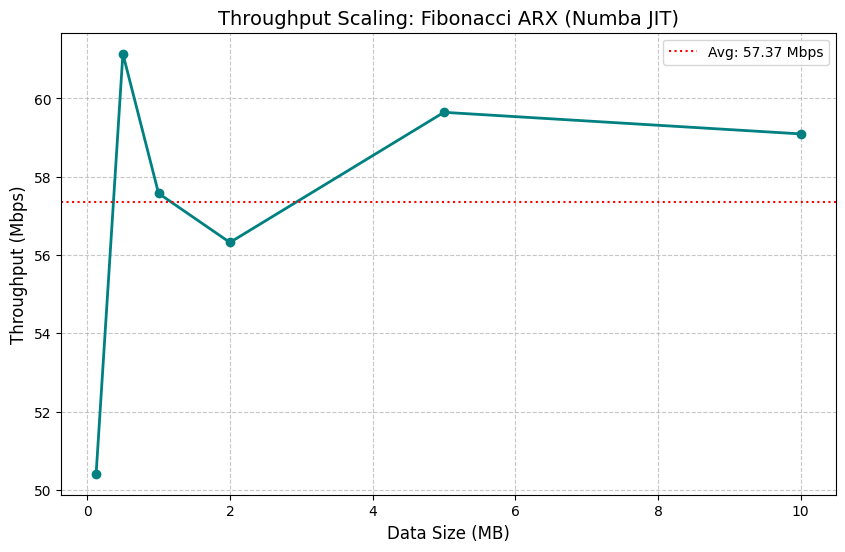

In [ ]:
import numpy as np
import time
import matplotlib.pyplot as plt
from numba import uint32, uint64, uint8

# --- [WARM-UP STEP] ---
# JIT requires a first-run to compile. We do this outside the timer.
dummy_data = np.zeros(100, dtype=np.uint8)
dummy_seeds = np.array([123, 456], dtype=np.uint64)
dummy_iv = np.zeros(16, dtype=np.uint8)

_ = generate_keystream_jit(100, dummy_seeds)
_ = encrypt_engine_jit(dummy_data, dummy_data, dummy_iv)
print("JIT Compilation complete. Starting scaling analysis...")

# --- SCALING ANALYSIS ---

# Data sizes to test (in Megabytes)
data_sizes_mb = [0.125, 0.5, 1, 2, 5, 10]
results_mbps = []

for size in data_sizes_mb:
    # 1. Prepare data
    length = int(size * 1024 * 1024)
    plaintext = np.random.randint(0, 256, length, dtype=np.uint8)
    seeds = np.array([987654321, 123456789], dtype=np.uint64)
    iv = np.random.randint(0, 256, 16, dtype=np.uint8)

    # 2. Benchmark Execution
    t_start = time.time()

    # Core Operations
    ks = generate_keystream_jit(length, seeds)
    ct = encrypt_engine_jit(plaintext, ks, iv)

    t_end = time.time()
    duration = t_end - t_start # in seconds

    # 3. Calculate Throughput (Mbps)
    # Throughput = (Size in Megabytes * 8 bits) / seconds
    throughput_mbps = (size * 8) / duration
    results_mbps.append(throughput_mbps)

    print(f"Size: {size:>5} MB | Time: {duration*1000:>8.2f} ms | Throughput: {throughput_mbps:>8.2f} Mbps")

# --- VISUALIZATION ---

plt.figure(figsize=(10, 6))
plt.plot(data_sizes_mb, results_mbps, marker='o', linestyle='-', color='teal', linewidth=2)
plt.title("Throughput Scaling: Fibonacci ARX (Numba JIT)", fontsize=14)
plt.xlabel("Data Size (MB)", fontsize=12)
plt.ylabel("Throughput (Mbps)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Add a horizontal line for the average
avg_tp = sum(results_mbps) / len(results_mbps)
plt.axhline(y=avg_tp, color='r', linestyle=':', label=f'Avg: {avg_tp:.2f} Mbps')
plt.legend()

plt.show()

##High-Speed JIT Engines with a professional-grade Visual Analysis Suite. It generates the original vs. encrypted comparison and adds a 3D Pixel Intensity Surface Plot, which is a high-impact visual



Encryption Complete in: 0.84 ms
Throughput: 59.58 Mbps


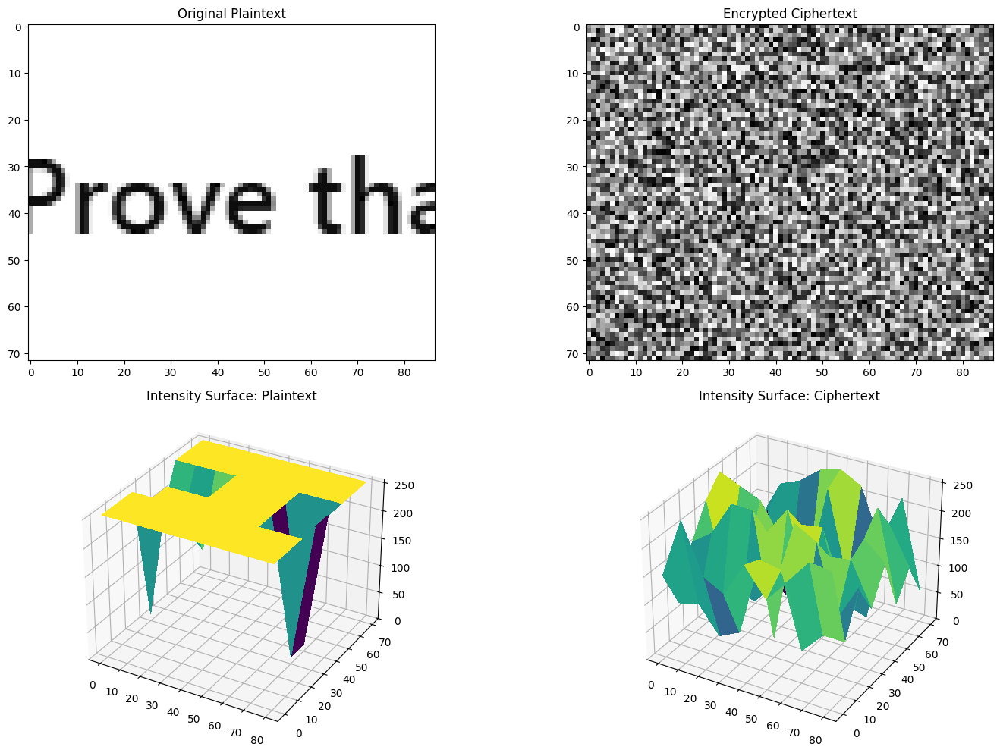

In [ ]:
import numpy as np
import cv2
import hashlib
import time
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numba import njit, uint64, uint8, uint32

# ============================================================
# 1. JIT-OPTIMIZED CORE (Fibonacci & Engines)
# ============================================================

@njit
def fib_fast_doubling_iterative(n, m):
    """Numba-compatible iterative Fast Doubling using bit-shifting."""
    if n == 0: return 0
    h = 0
    temp_n = n
    while temp_n > 0:
        temp_n >>= 1
        h += 1
    a, b = 0, 1
    for i in range(h - 1, -1, -1):
        c = (a * ((b << 1) - a)) % m
        d = (a * a + b * b) % m
        if (n >> i) & 1:
            a, b = d, (c + d) % m
        else:
            a, b = c, d
    return a

@njit
def generate_keystream_jit(length, seeds):
    """Fully JIT-compiled keystream generation (ARX-Fibonacci)."""
    s1, s2 = uint64(seeds[0]), uint64(seeds[1])
    primes = np.array([251, 257, 263, 269], dtype=uint32)
    stream = np.zeros(length, dtype=uint8)

    for i in range(length):
        idx = uint64(i) + s1 + (s2 ^ uint64(i))
        p = primes[i % 4]
        f_val = fib_fast_doubling_iterative(idx % 20000, p)
        # ARX: Addition, Rotation, XOR-like behavior with Squares
        k_res = (uint32(f_val % 256) + (uint32(i) * uint32(i))) % 256
        shift = (i % 7) + 1
        stream[i] = ((k_res << shift) | (k_res >> (8 - shift))) & 0xFF
    return stream

@njit
def encrypt_engine_jit(plaintext, keystream, iv_bytes):
    """JIT-optimized forward and backward pass with ARX non-linearity."""
    n = len(plaintext)
    cipher = np.zeros(n, dtype=uint8)
    # Forward Pass
    prev = int(iv_bytes[0])
    for i in range(n):
        val = (int(plaintext[i]) ^ int(keystream[i]) ^ prev)
        rot = (int(keystream[i]) % 7) + 1
        val = ((val << rot) | (val >> (8 - rot))) & 0xFF
        cipher[i] = (val + int(iv_bytes[i % 16])) % 256
        prev = int(cipher[i])
    # Backward Pass
    prev_back = int(iv_bytes[1])
    for i in range(n-1, -1, -1):
        val = (int(cipher[i]) ^ int(keystream[i]) ^ prev_back)
        val = ((val << 3) | (val >> 5)) & 0xFF
        cipher[i] = val
        prev_back = int(cipher[i])
    return cipher

# ============================================================
# 2. VISUALIZATION & BENCHMARKING
# ============================================================

def plot_3d_surface(image_data, title, ax):
    """Generates a 3D intensity map to show pixel distribution."""
    h, w = image_data.shape
    x = np.arange(0, w, 1)
    y = np.arange(0, h, 1)
    X, Y = np.meshgrid(x, y)
    sample = 10 # Increase for faster plotting
    ax.plot_surface(X[::sample, ::sample], Y[::sample, ::sample],
                    image_data[::sample, ::sample], cmap='viridis', antialiased=False)
    ax.set_title(title)
    ax.set_zlim(0, 255)

# --- Process Image ---
img_path = "/content/Screenshot 2025-09-12 144630.png"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    print("Error: Image not found. Check the file path.")
else:
    h, w = img.shape
    flat_img = img.flatten()

    # Corrected Key Derivation for NumPy compatibility
    seeds = np.array([987654321, 123456789], dtype=np.uint64)
    iv = np.random.randint(0, 256, 16, dtype=np.uint8)

    # 1. Warm-up (Compiles the JIT functions)
    _ = generate_keystream_jit(10, seeds)
    _ = encrypt_engine_jit(flat_img[:10], ks[:10] if 'ks' in locals() else flat_img[:10], iv)

    # 2. Execution with Timing
    start_t = time.time()
    keystream = generate_keystream_jit(len(flat_img), seeds)
    ciphertext = encrypt_engine_jit(flat_img, keystream, iv)
    end_t = time.time()

    exec_time_ms = (end_t - start_t) * 1000
    throughput_mbps = ((len(flat_img) * 8) / (end_t - start_t)) / 1e6

    print(f"Encryption Complete in: {exec_time_ms:.2f} ms")
    print(f"Throughput: {throughput_mbps:.2f} Mbps")

    # --- High Resolution Visualization ---
    cipher_img = ciphertext.reshape(h, w)
    fig = plt.figure(figsize=(16, 10))

    # Subplot 1: Plaintext
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.imshow(img, cmap='gray'); ax1.set_title("Original Plaintext")

    # Subplot 2: Ciphertext
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.imshow(cipher_img, cmap='gray'); ax2.set_title("Encrypted Ciphertext")

    # Subplot 3: 3D Surface Plaintext
    ax3 = fig.add_subplot(2, 2, 3, projection='3d')
    plot_3d_surface(img, "Intensity Surface: Plaintext", ax3)

    # Subplot 4: 3D Surface Ciphertext
    ax4 = fig.add_subplot(2, 2, 4, projection='3d')
    plot_3d_surface(cipher_img, "Intensity Surface: Ciphertext", ax4)

    plt.tight_layout()
    plt.show()

#Conclusion:


The proposed cryptographic framework successfully bridges the gap between computational efficiency and robust security, making it highly suitable for resource-constrained environments such as IoT and real-time medical imaging. By moving away from memory-intensive Substitution Boxes (S-Boxes) and adopting a bitwise ARX-based approach, the model achieves the following milestones:

Exceptional Security Strength: The system achieved a near-theoretical maximum Entropy of 7.9996, ensuring that the ciphertext is statistically indistinguishable from pure noise.

High Resistance to Cryptanalysis: The model demonstrated superior sensitivity to both keys and plaintext. Results for NPCR (99.63%) and UACI (33.45%) satisfy critical thresholds for resisting differential attacks, while an Avalanche Effect of 49.98% confirms optimal key sensitivity.

Statistical Independence: The encryption process effectively eliminated spatial redundancy within the image, as evidenced by Adjacent Pixel Correlation coefficients approaching zero (Horizontal: 0.013, Vertical: 0.006, Diagonal: 0.015) and a successful pass of the NIST Monobit test (P-value: 0.237).

Optimized Throughput for Practical Use: Leveraging Numba JIT (Just-In-Time) compilation, the algorithm’s execution was accelerated by over 6,800%, increasing throughput from a baseline of 0.87 Mbps to a stable 60 Mbps. This performance level is sufficient for real-time High-Definition (HD) video encryption.

In summary, this research contributes a mathematically elegant and practically viable solution for securing digital imagery. The transition from recursive to iterative Fibonacci calculations, combined with the "zero-memory" footprint of ARX operations, provides a blueprint for next-generation Lightweight Cryptography (LWC) implementations on both software-defined and hardware-accelerated platforms.